In [3]:
import saflow
from saflow.visualization import grid_topoplot
from saflow.utils import get_meg_picks_and_info
from saflow.stats import simple_contrast
from saflow.data import balance_data, load_fooof_data
import pickle as pkl
import os.path as op
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [4]:
feature = 'fooof_1022_knee_sensor_8trials'
feature_fpath = op.join(saflow.BIDS_PATH, 'derivatives', feature)
feat_to_get = 'psd_corrected'
classif = 'INOUT_2575'
trial_type_to_get = ['correct_omission', 'commission_error']
trial_type_formatted = '-'.join(trial_type_to_get)
classif_name_data = f'{classif}_{feature}_{feat_to_get}_{trial_type_formatted}'

picks, chan_info = get_meg_picks_and_info('12','02')

loaded_data_filename = f'../tmp/{classif_name_data}.pkl'
if not op.exists(loaded_data_filename):
    X, y, groups, VTC, task = load_fooof_data(feature, feature_fpath, feat_to_get, trial_type_to_get, classif=classif)
    with open(loaded_data_filename, 'wb') as f:
        pkl.dump([X, y, groups, VTC, task], f)
else:
    with open(loaded_data_filename, 'rb') as f:
        X, y, groups, VTC, task = pkl.load(f)

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Removing 5 compensators from info because not all compensation channels were picked.


In [5]:
feature = 'fooof_1022_knee_sensor_8trials'
feature_fpath = op.join(saflow.BIDS_PATH, 'derivatives', feature)
feat_to_get = 'ksor'
classif = 'INOUT_2575'
trial_type_to_get = ['correct_omission', 'commission_error']
trial_type_formatted = '-'.join(trial_type_to_get)
classif_name_data = f'{classif}_{feature}_{feat_to_get}_{trial_type_formatted}'

picks, chan_info = get_meg_picks_and_info('12','02')

loaded_data_filename = f'../tmp/{classif_name_data}.pkl'
if not op.exists(loaded_data_filename):
    X_ksor, y_ksor, groups_ksor, VTC_ksor, task_ksor = load_fooof_data(feature, feature_fpath, feat_to_get, trial_type_to_get, classif=classif)
    with open(loaded_data_filename, 'wb') as f:
        pkl.dump([X_ksor, y_ksor, groups_ksor, VTC_ksor, task_ksor], f)
else:
    with open(loaded_data_filename, 'rb') as f:
        X_ksor, y_ksor, groups_ksor, VTC_ksor, task_ksor = pkl.load(f)

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Removing 5 compensators from info because not all compensation channels were picked.


In [45]:
def average_channels_by_group(X, chan_info, atlas=None):
    if atlas == 'antoine':
        MEG_atlas = {
        "CL": list(range(0, 24)),
        "FL": list(range(24, 57)),
        "OL": list(range(57, 76)),
        "PL": list(range(76, 97)),
        "TL": list(range(97, 131)),
        "CR": list(range(131, 153)),
        "FR": list(range(153, 186)),
        "OR": list(range(186, 204)),
        "PR": list(range(204, 226)),
        "TR": list(range(226, 259)),
        "CZ": list(range(259, 263)),
        "Fz": list(range(263, 266)),
        "OZ": list(range(266, 269)),
        "PZ": list(range(269, 270)),
    }
    elif atlas == None:
        MEG_atlas = {}
        for chan_idx, chan in enumerate(chan_info['ch_names']):
            if chan[:3] not in MEG_atlas.keys():
                MEG_atlas[chan[:3]] = [chan_idx]
            else:
                MEG_atlas[chan[:3]].append(chan_idx)

    averaged_channels = []
    for group in MEG_atlas.keys():
        averaged_channels.append(np.nanmean(X[:,:,MEG_atlas[group]], axis=2))

    averaged_channels = np.array(averaged_channels).transpose(1,2,0)
    return averaged_channels, MEG_atlas

def compute_prop_error_across_power(band_power, task, binsize=0.1, n_bins=50):
    if n_bins is not None:
        binsize = (np.max(band_power) - np.min(band_power)) / n_bins

    band_bins = np.arange(np.min(band_power), np.max(band_power), binsize)
    n_commission_errors = []
    n_correct_omissions = []
    for bin_idx in range(len(band_bins[:-1])):
        n_commission_errors.append(np.sum((band_power >= band_bins[bin_idx]) & (band_power < band_bins[bin_idx+1]) & (task == 'commission_error')))
        n_correct_omissions.append(np.sum((band_power >= band_bins[bin_idx]) & (band_power < band_bins[bin_idx+1]) & (task == 'correct_omission')))
    n_commission_errors = np.array(n_commission_errors)
    n_correct_omissions = np.array(n_correct_omissions)
    prop_commission_errors = n_commission_errors / (n_commission_errors + n_correct_omissions)

    prop_error_df = pd.DataFrame({'band_bins':band_bins[1:], 'prop_commission_errors':prop_commission_errors})
    return prop_error_df

def vtc_scatterplot(plot_df, feature='alpha', xlabel=None, ax=None, lineplot=True):
    if ax == None:
        fig, ax = plt.subplots()
    ax2 = ax.twinx()
    
    # replace 0 by 'IN' and 1 by 'OUT' in inout
    plot_df['inout'].replace(0, 'IN', inplace=True)
    plot_df['inout'].replace(1, 'OUT', inplace=True)
    # merge task and inout
    plot_df['task_split'] = plot_df['task'] + '_' + plot_df['inout']

    

    hue_order = ['correct_omission_OUT', 'commission_error_OUT', 'correct_omission_IN', 'commission_error_IN']
    palette = ["#FFA07A", "#FF8C00", "#ADD8E6", "#00008B"]
    size_order = hue_order
    # palette is grey and black respectivly
    sns.histplot(data=plot_df, x=feature, hue='task', ax=ax, 
                 multiple='stack', 
                 hue_order=['correct_omission', 'commission_error'], 
                 palette=["#808080", "#000000"],
                 stat='count',
                 bins=50)
    # Turn off histogram y-axis
    ax2.set_ylabel('')
    ax2.set_yticks([])
    ax2.set_yticklabels([])
    
    sns.scatterplot(data=plot_df, x=feature, y='VTC', hue='task_split', 
                    palette=palette, 
                    size='task_split', 
                    sizes=[5,40,5,40], 
                    hue_order=hue_order,
                    size_order=size_order,
                    alpha=0.2,
                    ax=ax2)
    if lineplot:
        prop_error_df = compute_prop_error_across_power(plot_df[feature].values, task, n_bins=50)
        ax3 = ax.twinx()
        sns.lineplot(data=prop_error_df, x='band_bins', y='prop_commission_errors', ax=ax3, color='black')
        ax3.set_ylabel('Proportion of commission errors')

    ax2.legend(loc='upper left')
    #ax.legend(loc='upper left')
    ax.set_xlabel(f'{xlabel}')
    return [ax,ax2]




In [7]:
X_chan_avg, MEG_atlas = average_channels_by_group(X, chan_info, atlas=None)

In [49]:
# For each bin of alpha power compute the proportion of commission_errors over all trials
band_power = np.nanmedian(X_chan_avg[2,:,:], axis=1)

prop_error_df = compute_prop_error_across_power(band_power, task, n_bins=50)



In [51]:
prop_error_df

,band_bins,prop_commission_errors
0,-0.124278,0.000000
1,-0.102335,0.333333
2,-0.080392,0.400000
3,-0.058450,0.250000
4,-0.036507,0.285714
5,-0.014564,0.320755
6,0.007379,0.280000
7,0.029322,0.202532
8,0.051265,0.254902
9,0.073207,0.131313


In [ ]:
import statsmodels.api as sm
import pandas as pd

# Example DataFrame
# df = pd.DataFrame({
#     'alpha_power': [...], 
#     'trial_result': [...]  # 'success' or 'error'
# })

# Convert 'trial_result' to binary
average_alpha = np.nanmean(X[2,:,:], axis=1)

plot_df = pd.DataFrame({'VTC':VTC, 'task':task, 'alpha_power':average_alpha, 'inout':y})
plot_df['trial_result'] = plot_df['task'].map({'correct_omission': 0, 'commission_error': 1})

# Prepare the data for quadratic regression
plot_df['alpha_power_sq'] = plot_df['alpha_power'] ** 2
X = plot_df[['alpha_power', 'alpha_power_sq']]
X = sm.add_constant(X)  # Adds a constant term to the predictor
y_reg = plot_df['trial_result']
# Fit the quadratic regression model
model = sm.OLS(y, X).fit()

# Print the summary of the regression
print(model.summary())


In [56]:
task

array(['commission_error', 'commission_error', 'commission_error', ...,
       'commission_error', 'correct_omission', 'correct_omission'],
      dtype='<U16')

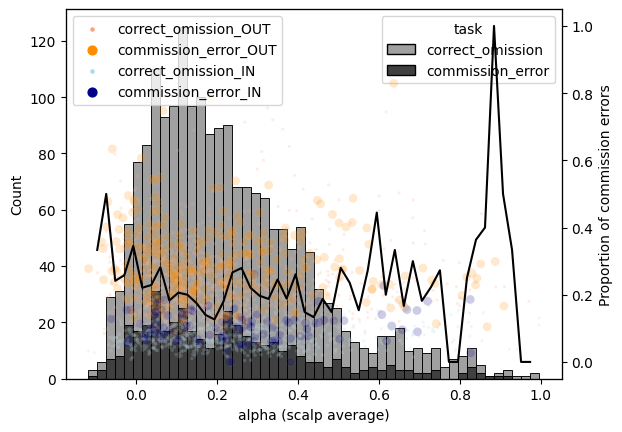

In [52]:
import seaborn as sns

average_alpha = np.nanmean(X[2,:,:], axis=1)

plot_df = pd.DataFrame({'VTC':VTC, 'task':task, 'alpha':average_alpha, 'inout':y})

fig, axes = vtc_scatterplot(plot_df, feature='alpha', xlabel='alpha (scalp average)')
#plt.set_ylabel('Average VTC in epoch')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

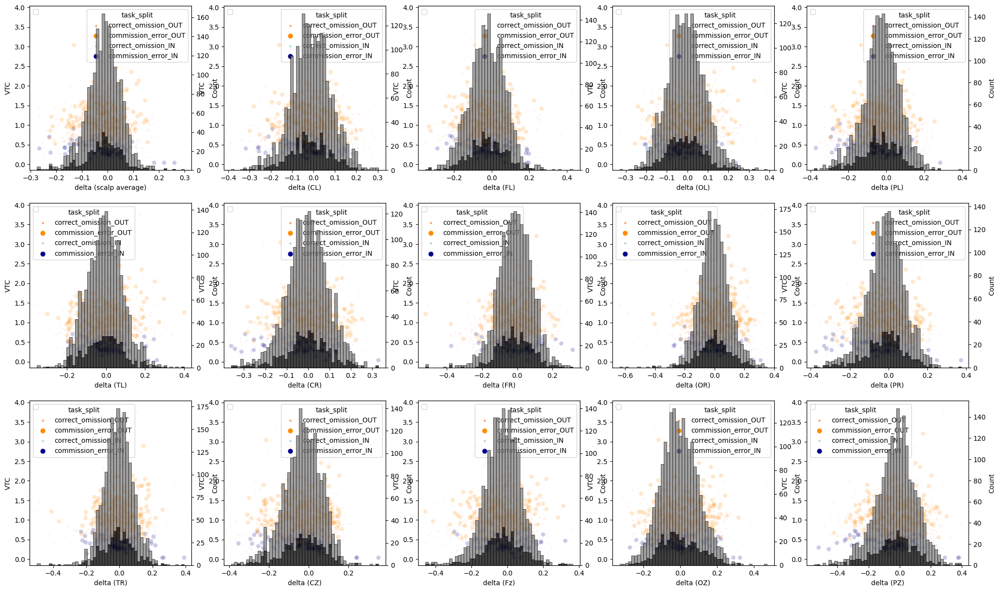

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

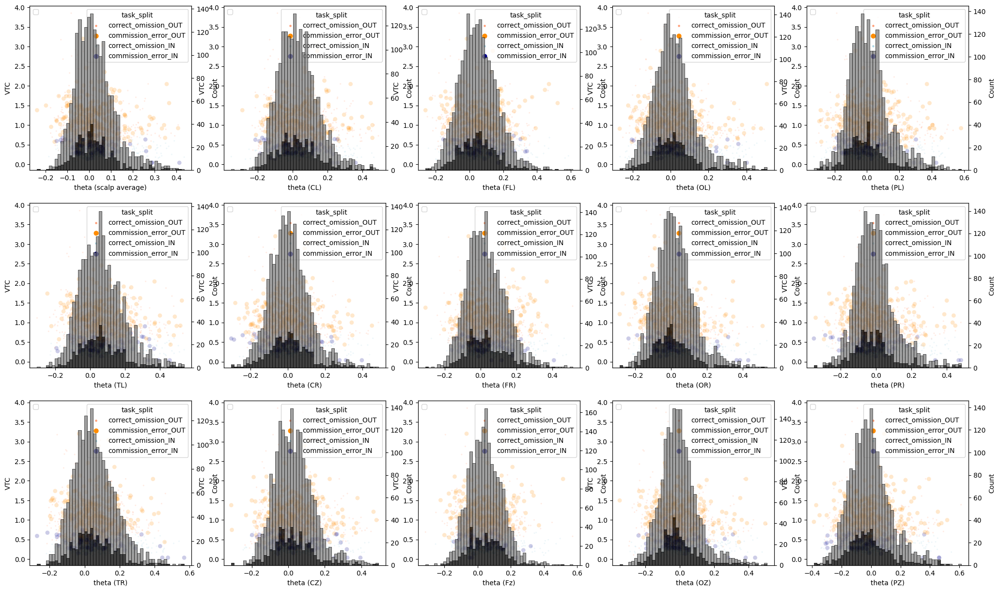

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

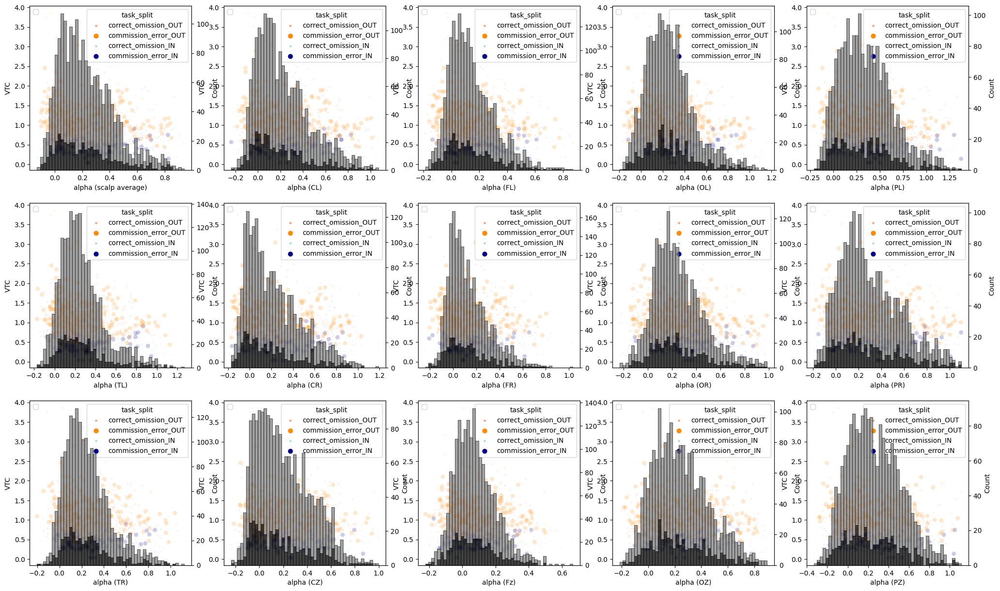

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

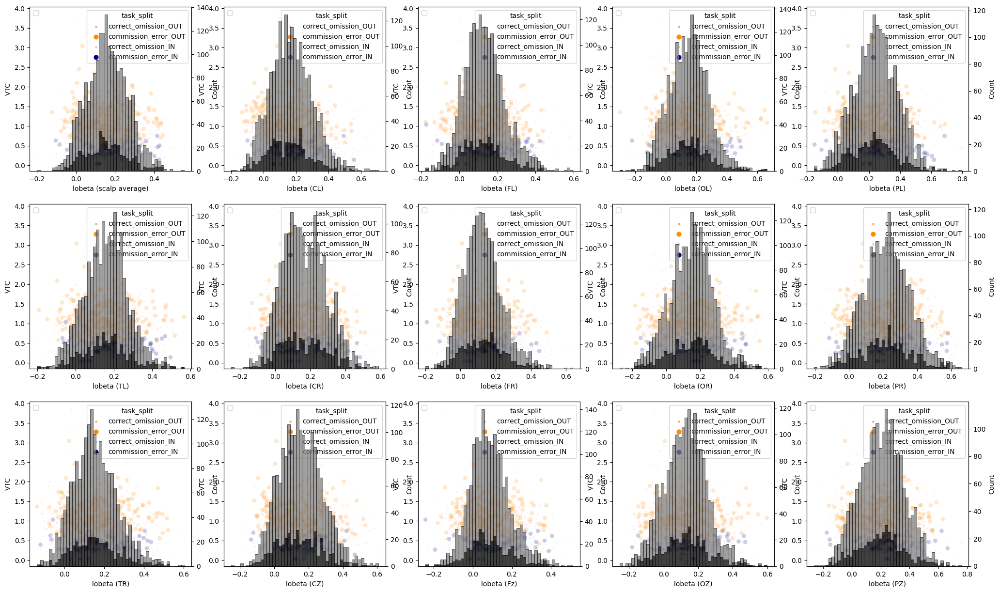

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

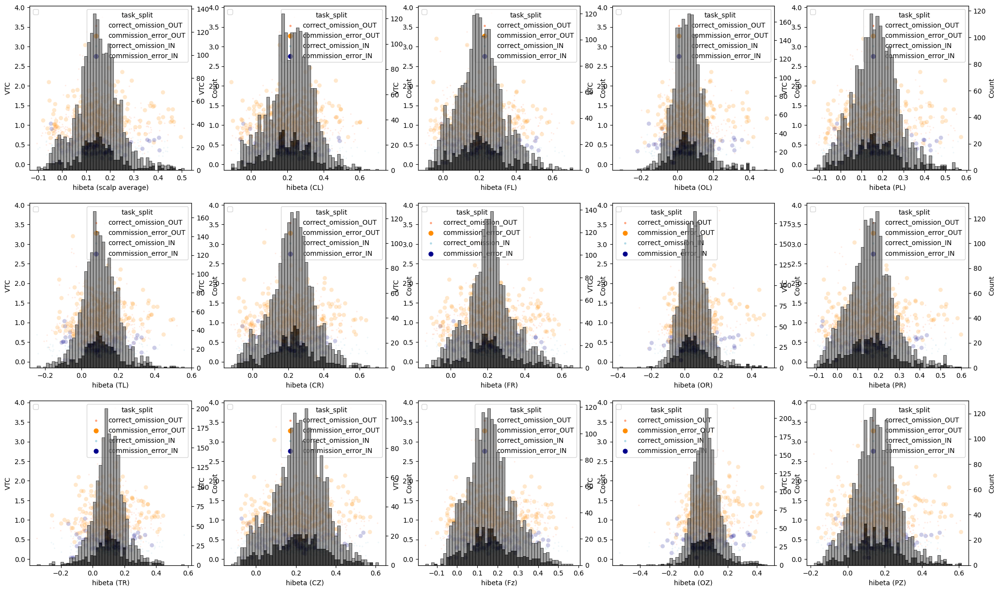

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

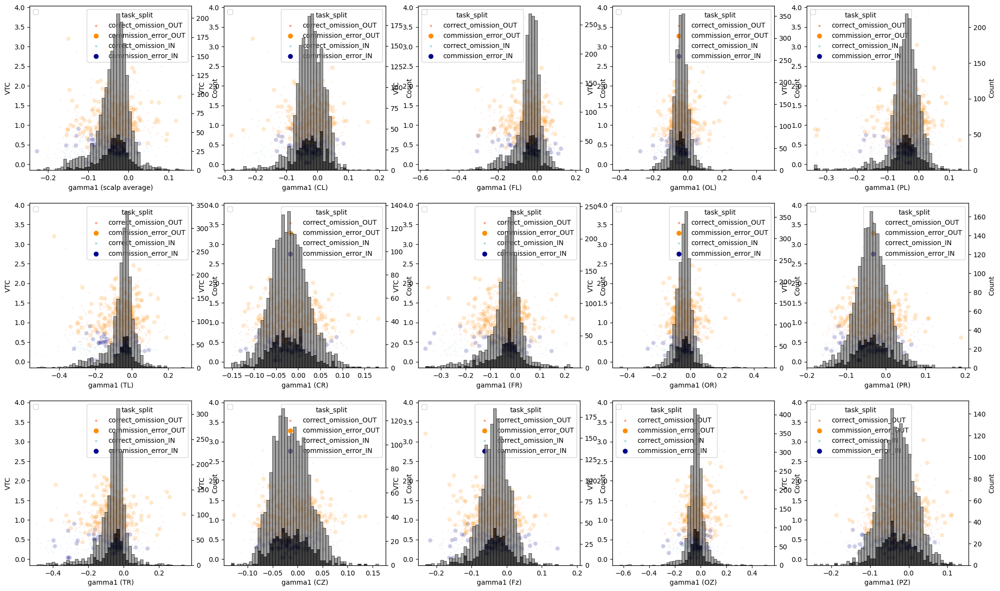

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

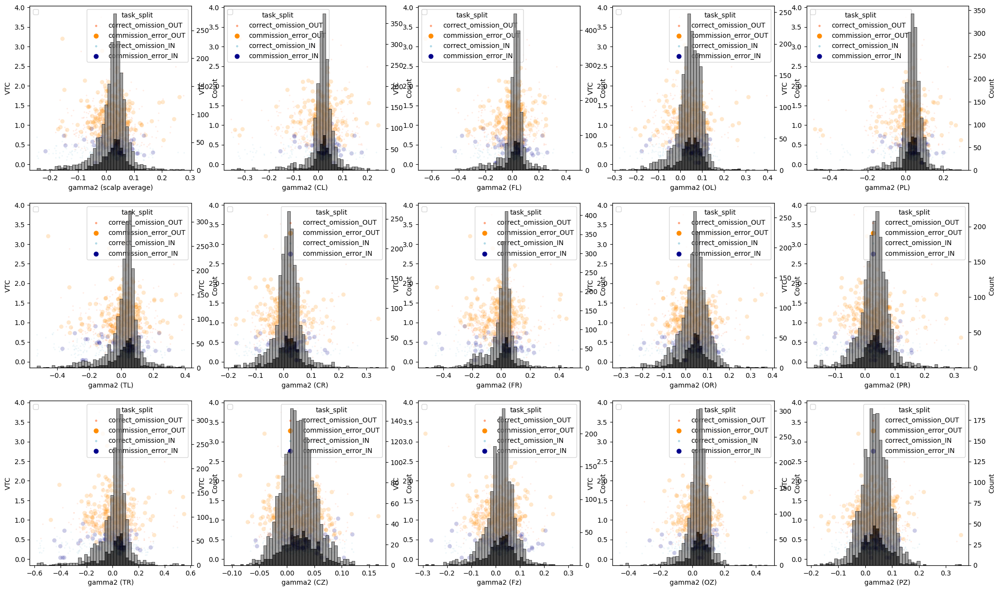

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

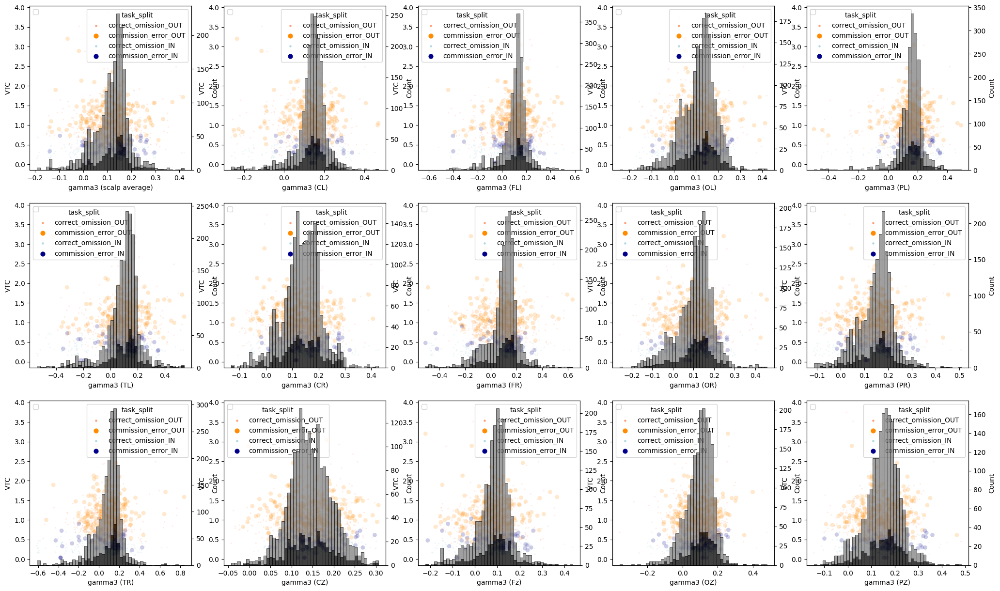

In [23]:
X_chan_avg, MEG_atlas = average_channels_by_group(X, chan_info, atlas='antoine')
for feat_idx in range(X_chan_avg.shape[0]):
    fig, axes = plt.subplots(3,5, figsize=(25,15))
    axes_flat = axes.flatten()
    for region_idx in range(X_chan_avg.shape[-1]):
        ax = axes_flat[region_idx+1]
        band_power = X_chan_avg[feat_idx,:,region_idx]
        plot_df = pd.DataFrame({'VTC':VTC, 'task':task, 'power':band_power, 'inout':y})
        vtc_scatterplot(plot_df, feature='power',
                        ax=ax, 
                        xlabel=f'{saflow.FREQS_NAMES[feat_idx]} ({list(MEG_atlas.keys())[region_idx]})')
    ax = axes_flat[0]
    band_power = np.nanmean(X_chan_avg[feat_idx,:,:], axis=1)
    plot_df = pd.DataFrame({'VTC':VTC, 'task':task, 'power':band_power, 'inout':y})
    vtc_scatterplot(plot_df, feature='power',
                    ax=ax, 
                    xlabel=f'{saflow.FREQS_NAMES[feat_idx]} (scalp average)')
    plt.show()
        

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

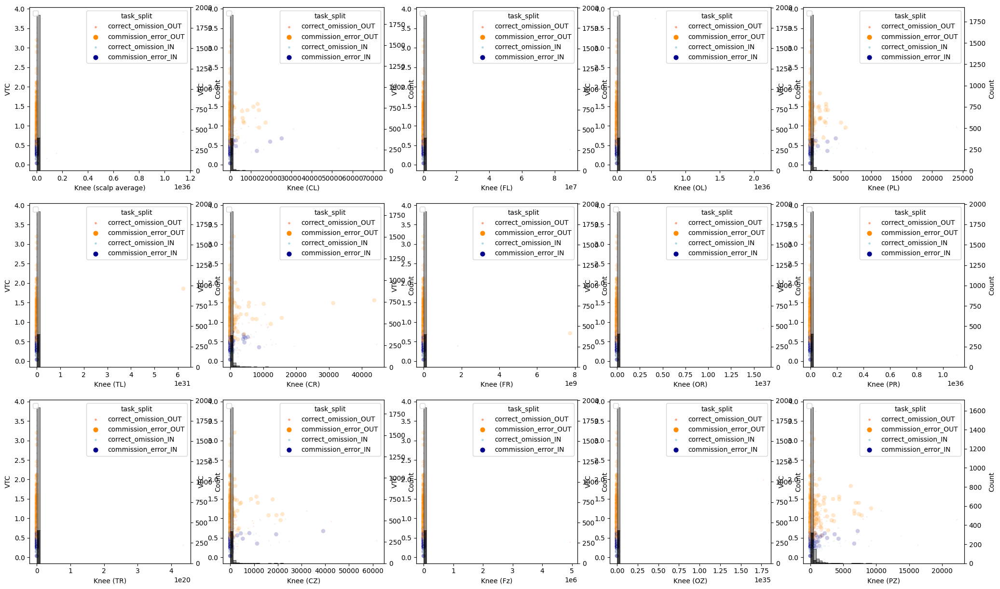

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

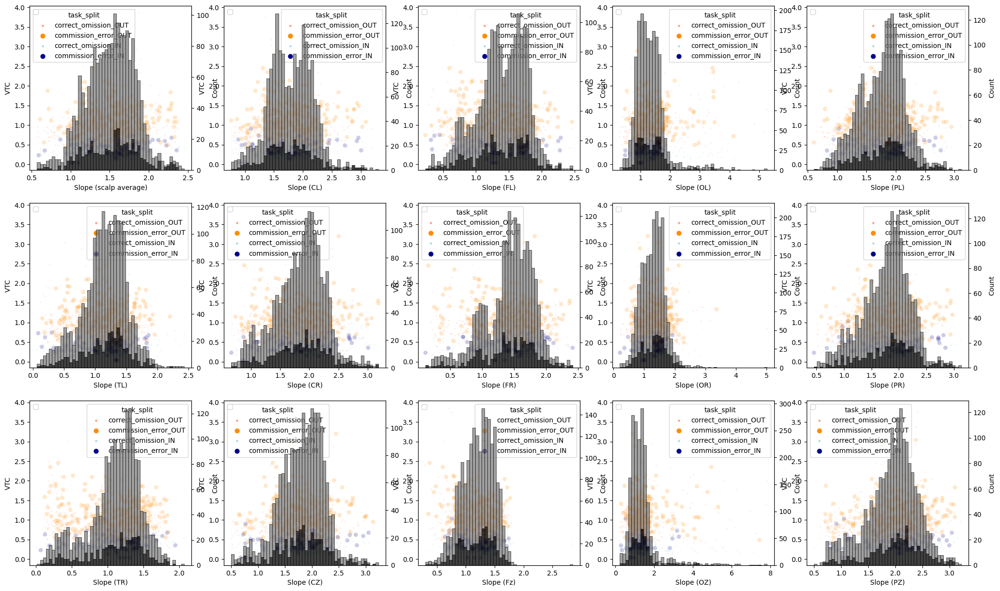

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

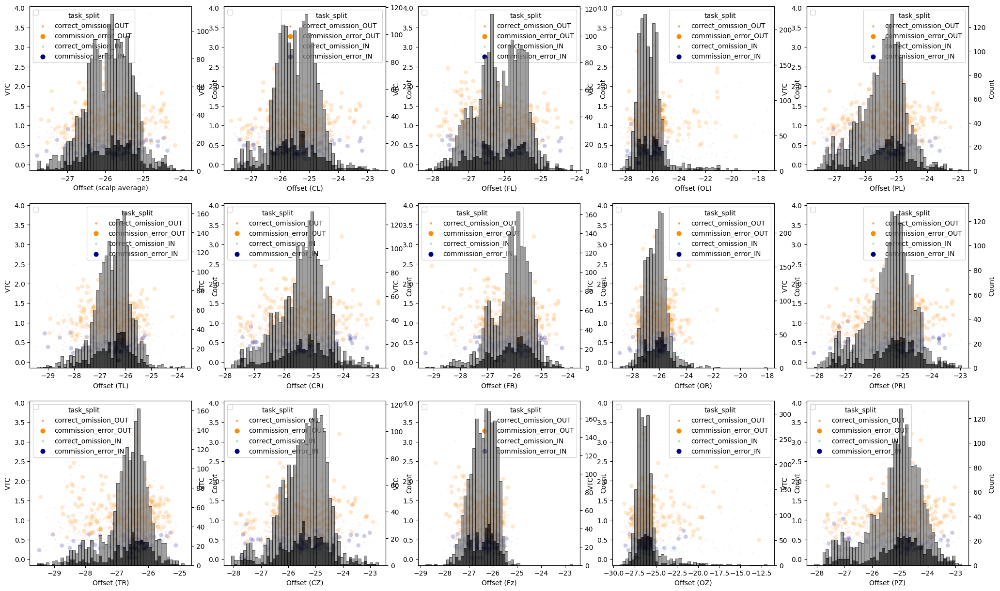

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

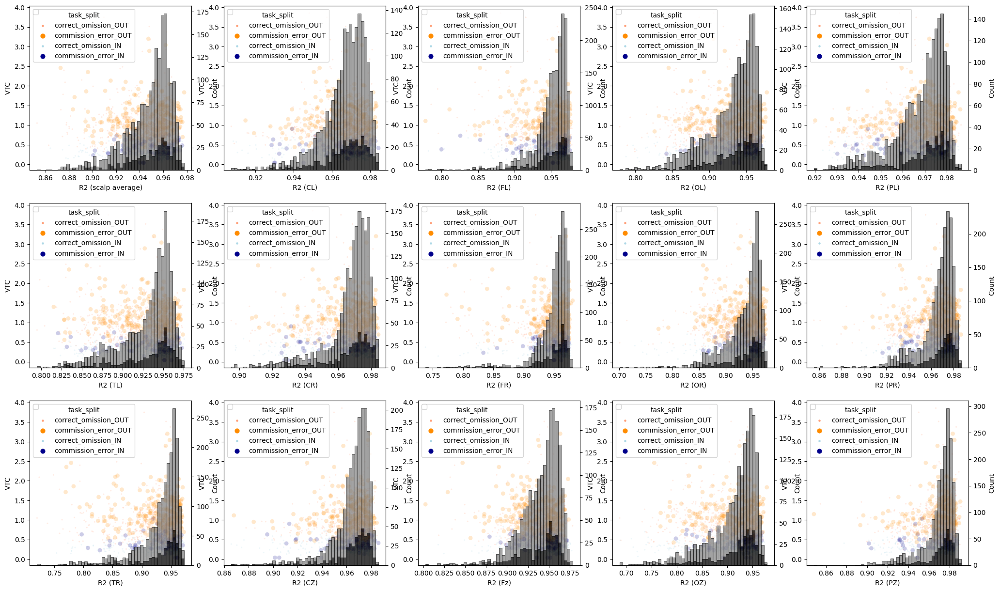

In [22]:
X_chan_avg, MEG_atlas = average_channels_by_group(X_ksor, chan_info, atlas='antoine')
labels = ['Knee', 'Slope','Offset', 'R2']
for feat_idx in range(X_chan_avg.shape[0]):
    fig, axes = plt.subplots(3,5, figsize=(25,15))
    axes_flat = axes.flatten()
    for region_idx in range(X_chan_avg.shape[-1]):
        ax = axes_flat[region_idx+1]
        band_power = X_chan_avg[feat_idx,:,region_idx]
        plot_df = pd.DataFrame({'VTC':VTC_ksor, 'task':task_ksor, 'power':band_power, 'inout':y_ksor})
        vtc_scatterplot(plot_df, feature='power',
                        ax=ax, 
                        xlabel=f'{labels[feat_idx]} ({list(MEG_atlas.keys())[region_idx]})')
    ax = axes_flat[0]
    band_power = np.nanmean(X_chan_avg[feat_idx,:,:], axis=1)
    plot_df = pd.DataFrame({'VTC':VTC_ksor, 'task':task_ksor, 'power':band_power, 'inout':y_ksor})
    vtc_scatterplot(plot_df, feature='power',
                    ax=ax, 
                    xlabel=f'{labels[feat_idx]} (scalp average)')
    plt.show()
        

In [14]:
X_ksor.shape

(4, 1913, 270)

In [16]:
len(VTC_ksor)

1913